<a href="https://colab.research.google.com/github/mhdfudhail/Coral_Reef_Detection_YOLOV5/blob/main/CoralReef_yoloV5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install
%pip install -q roboflow

import torch
import utils
from IPython.display import Image, clear_output
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.4/78.2 GB disk)


In [2]:
from roboflow import Roboflow
# rf = Roboflow(model_format="yolov5", notebook="ultralytics")


In [3]:
import os
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [4]:
rf = Roboflow(api_key="JDHuBpJ41TLhvZyqIXKP")
project = rf.workspace("minor-project-lp70h").project("coral-reef-detection")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/coral-reef-detection-1 in yolov5pytorch:: 100%|██████████| 12322/12322 [00:03<00:00, 3956.27it/s]


In [5]:
!python train.py --img 640 --batch 20 --epochs 32 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/coral-reef-detection-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=32, batch_size=20, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.

In [6]:
print("hello")

hello


In [8]:
%load_ext tensorboard
%tensorboard --logdir runs


<IPython.core.display.Javascript object>

In [9]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.15 --source {dataset.location}/valid/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/coral-reef-detection-1/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.15, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
image 1/573 /content/datasets/coral-reef-detection-1/valid/images/37001001501-Copy_jpg.rf.6ad568f7bf5c8923c56b49a782d1085e.jpg: 640x640 1 0, 11.5ms
image 2/573 /content/datasets/coral-reef-detection-1/valid/images/37001001501-Copy_jpg.rf.840b940b7387bd86b937ac2d5dea6a04.jpg: 640x640 1 0, 11.6ms
image 3/573 /con

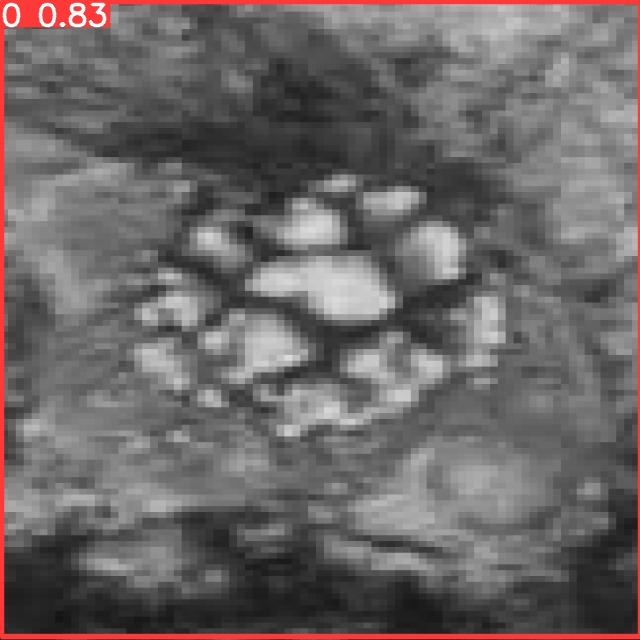

/n


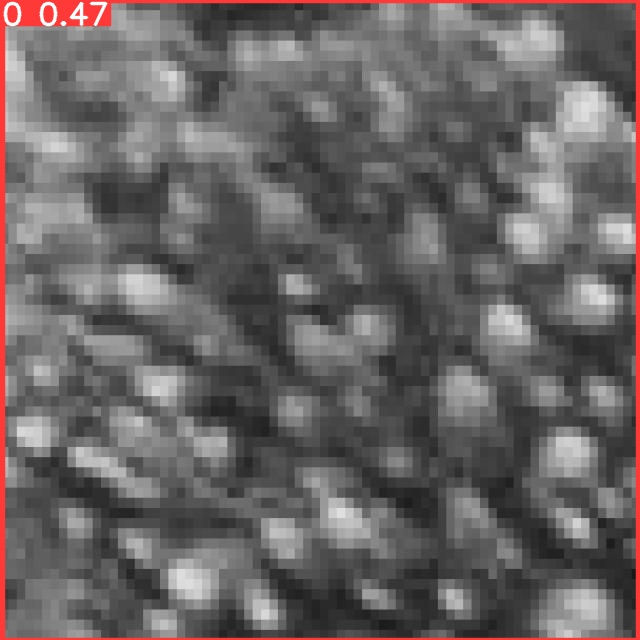

/n


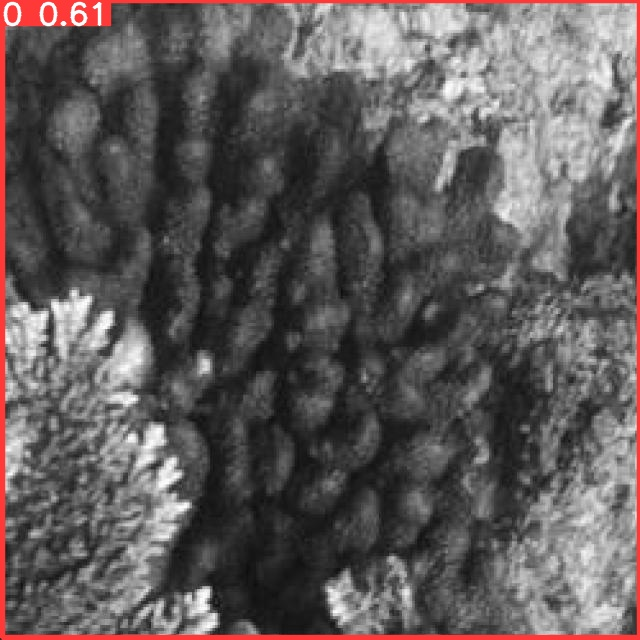

/n


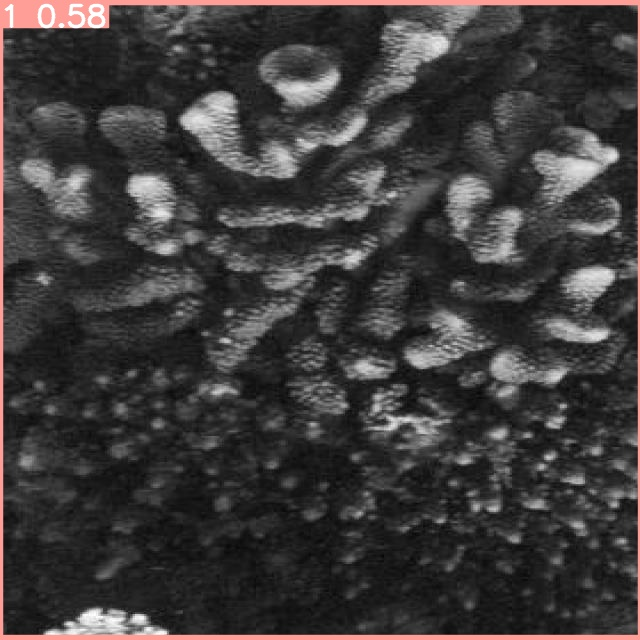

/n


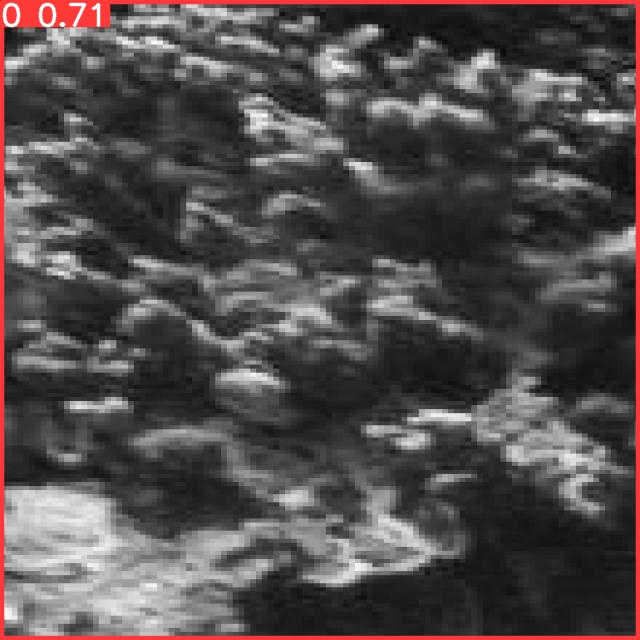

/n


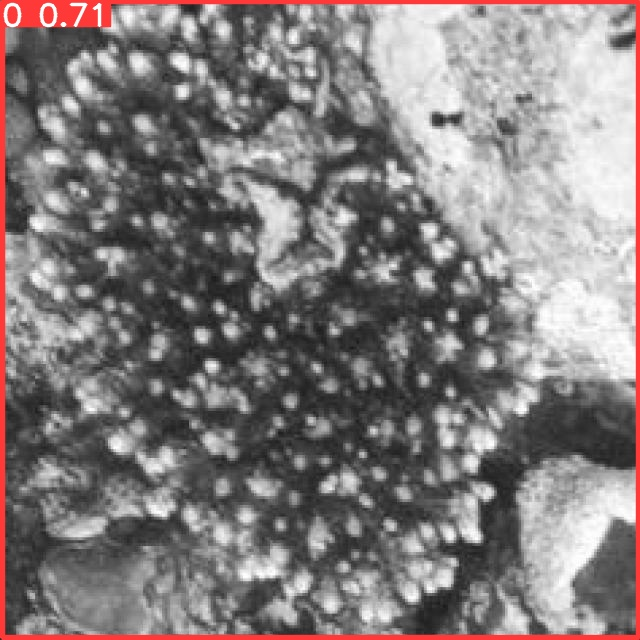

/n


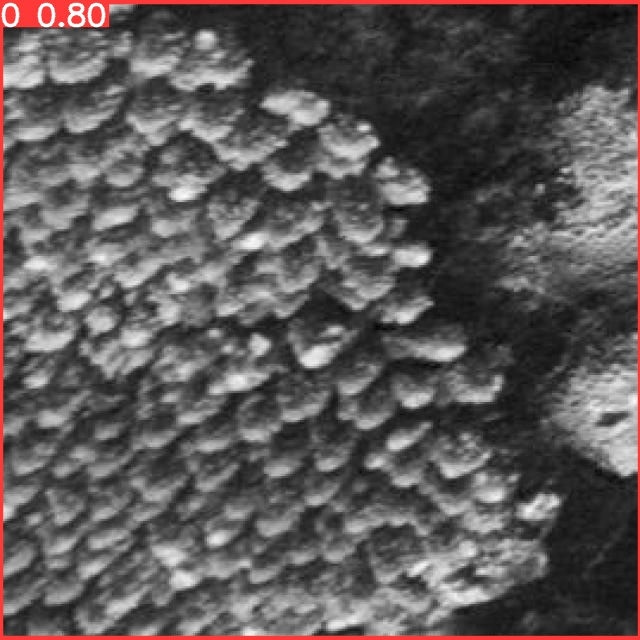

/n


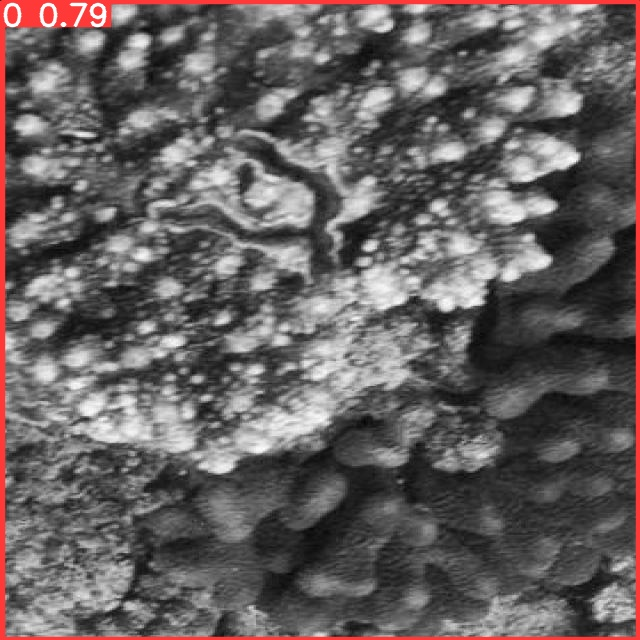

/n


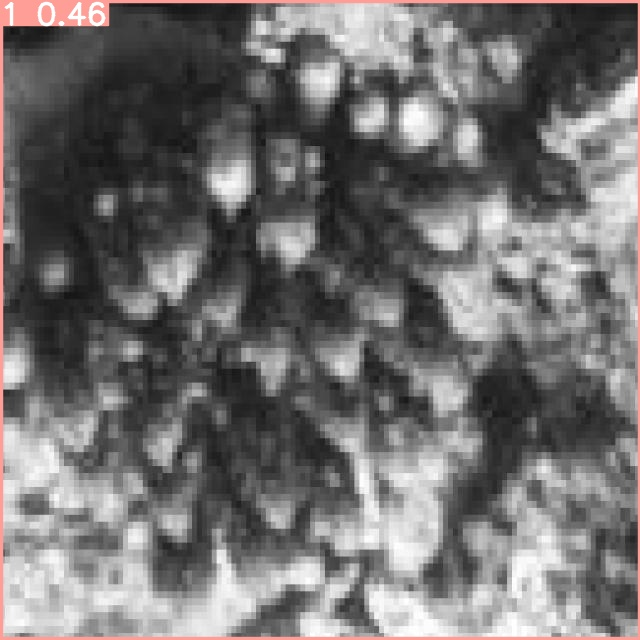

/n


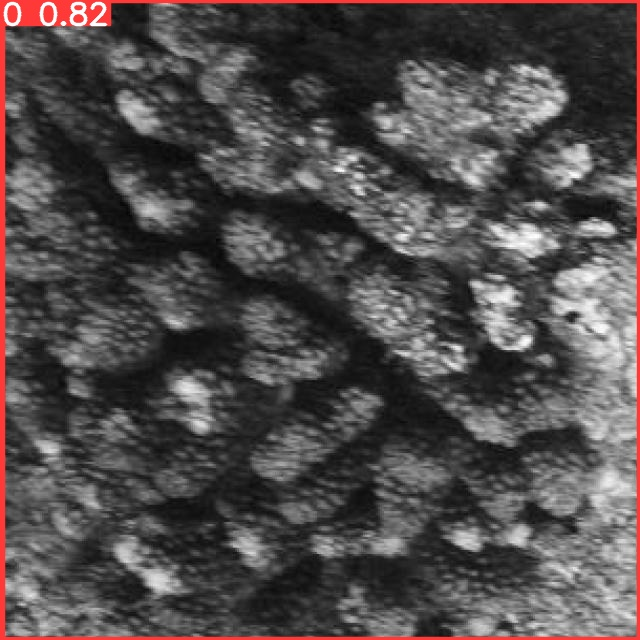

/n


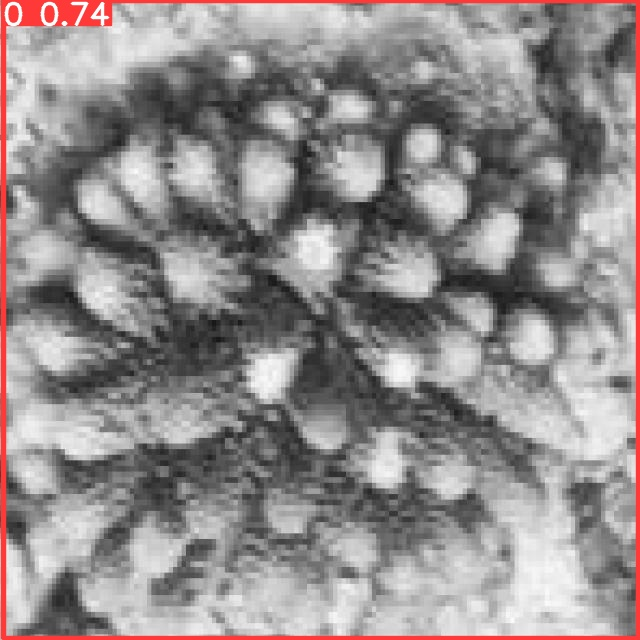

/n


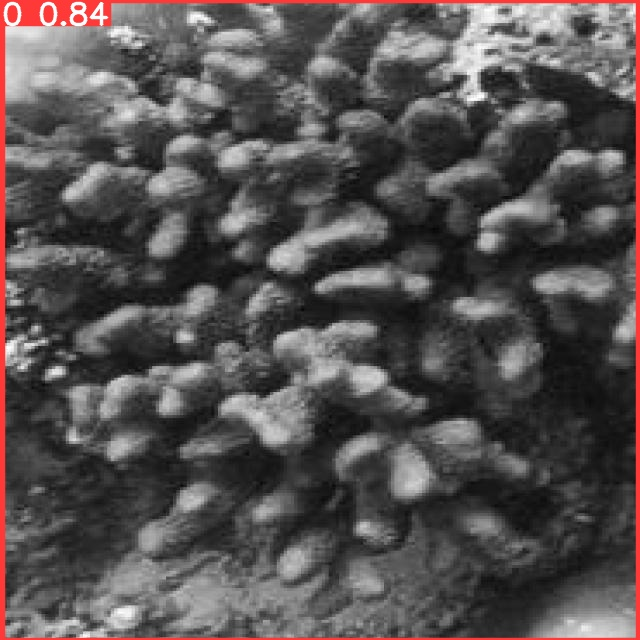

/n


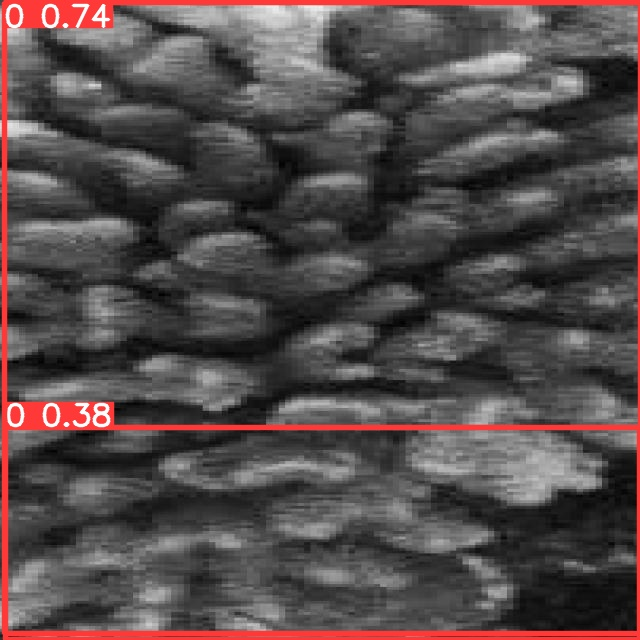

/n


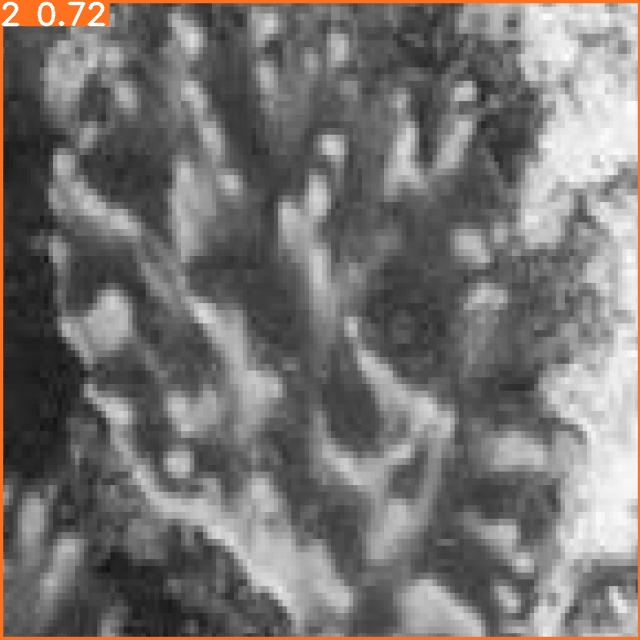

/n


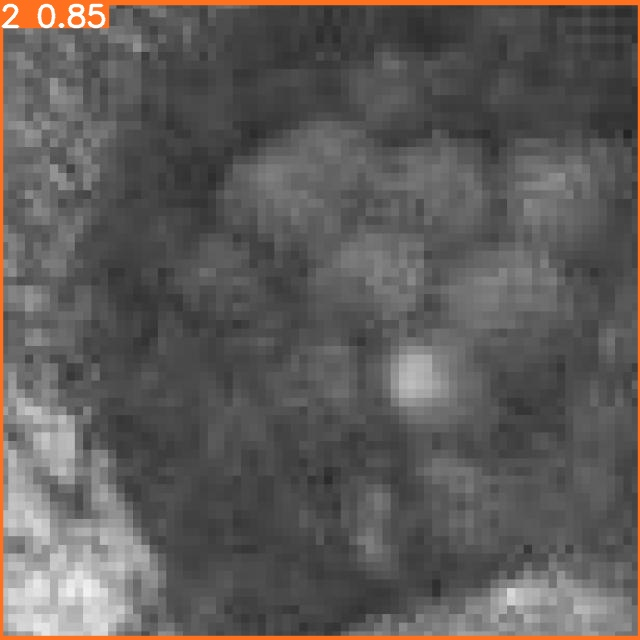

/n


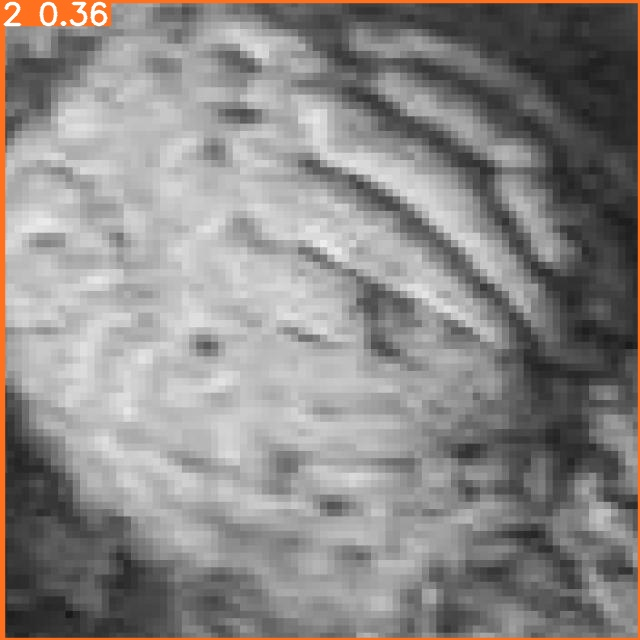

/n


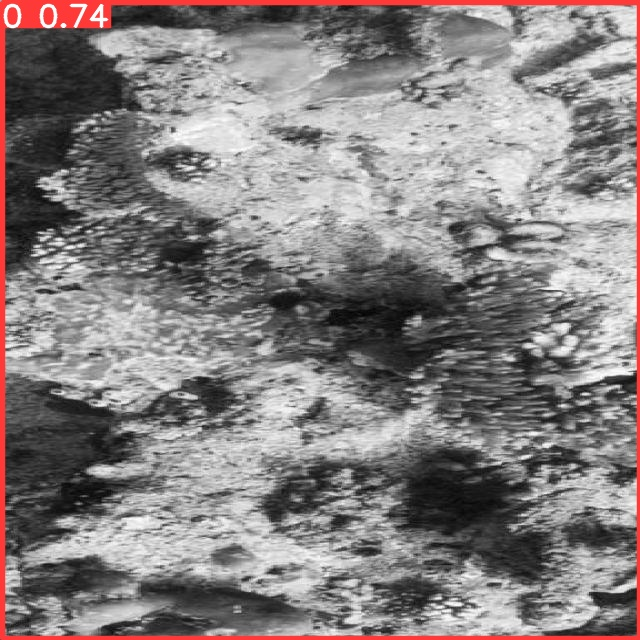

/n


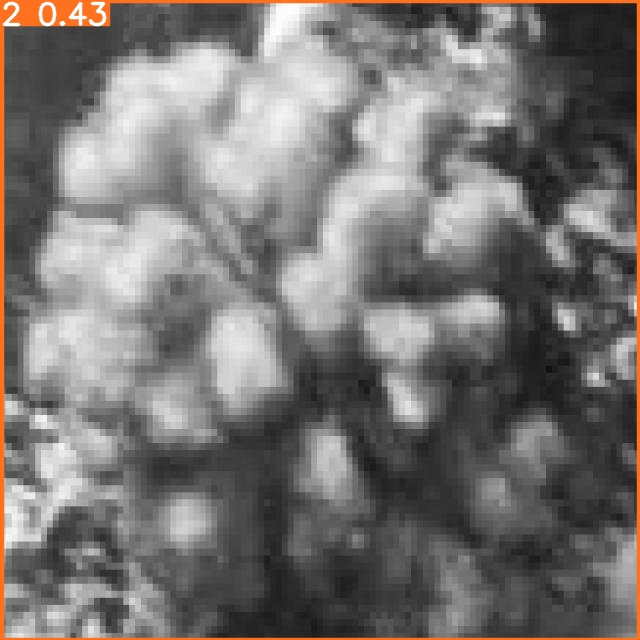

/n


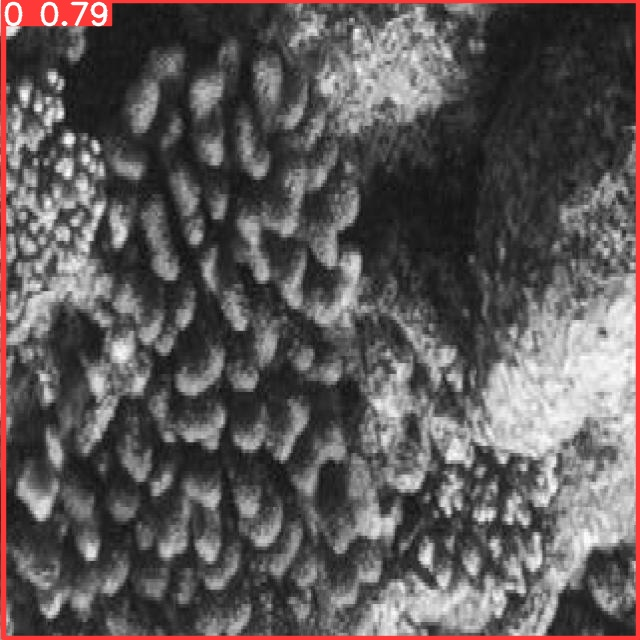

/n


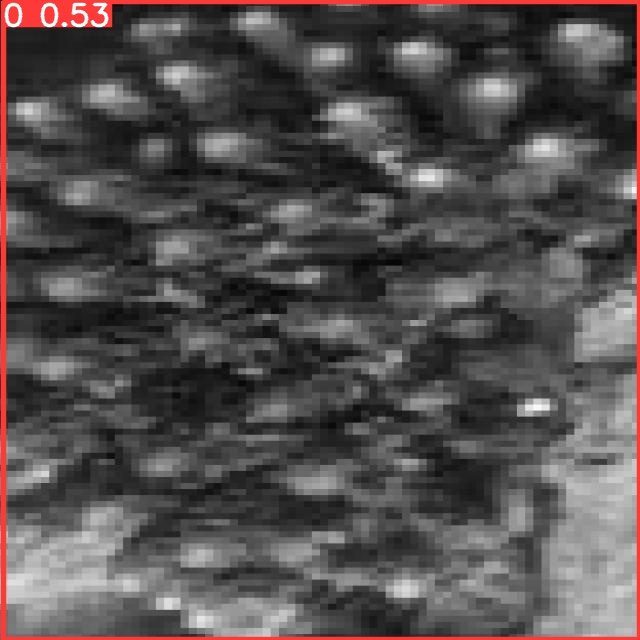

/n


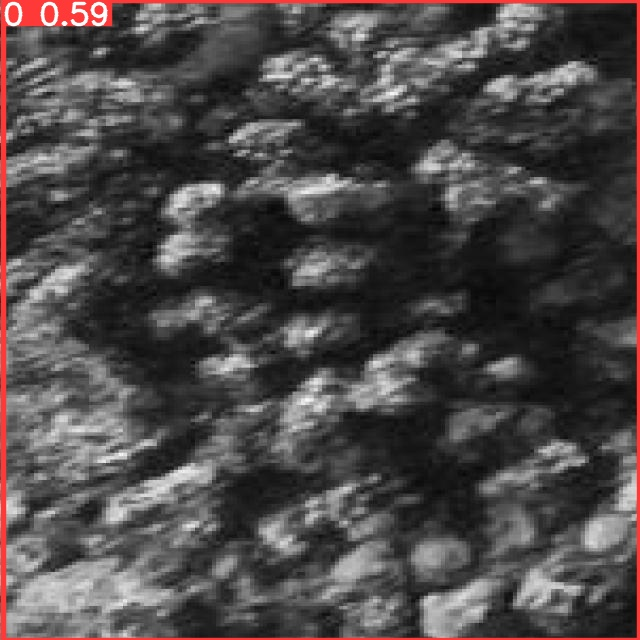

/n


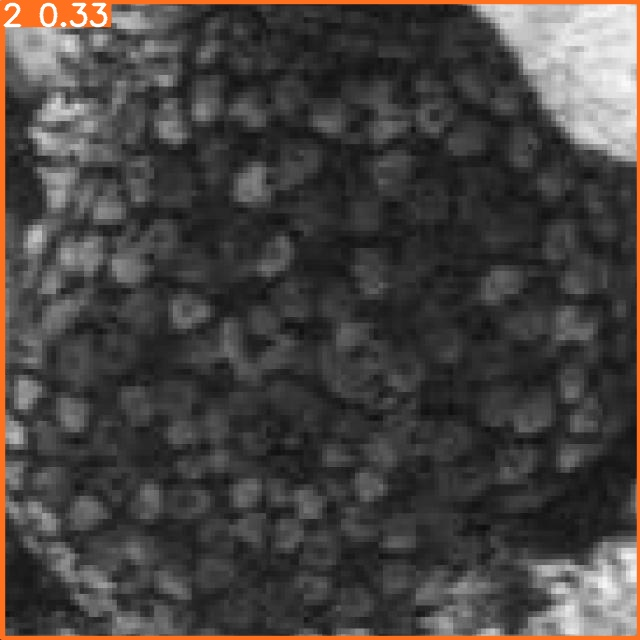

/n


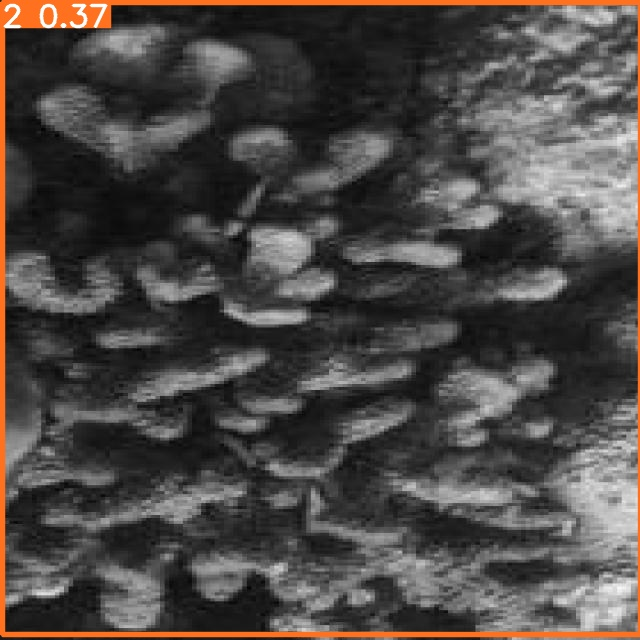

/n


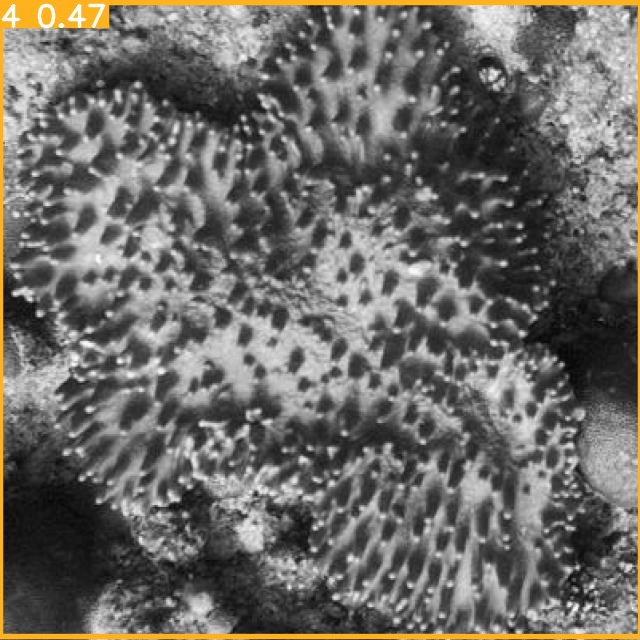

/n


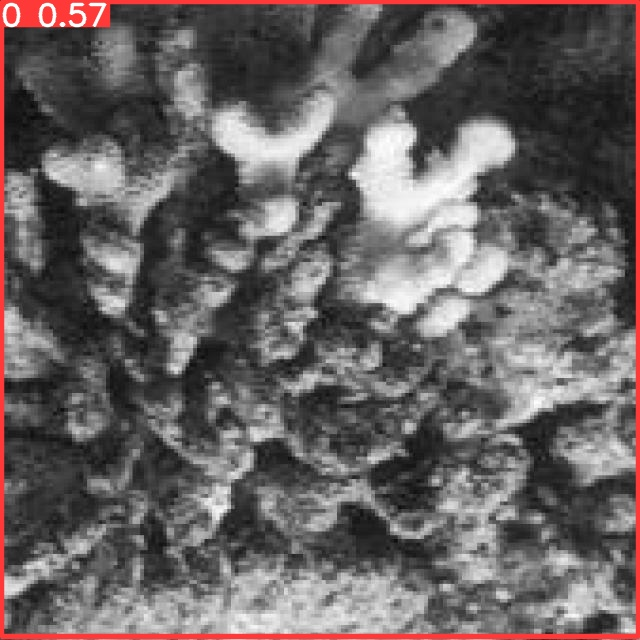

/n


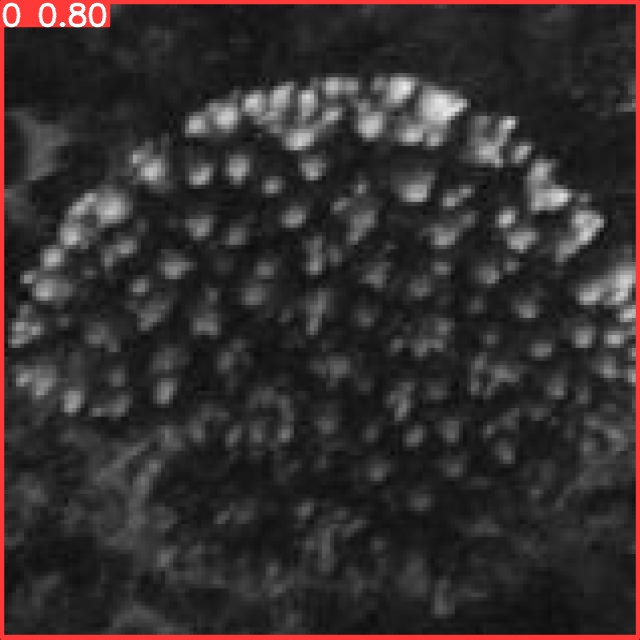

/n


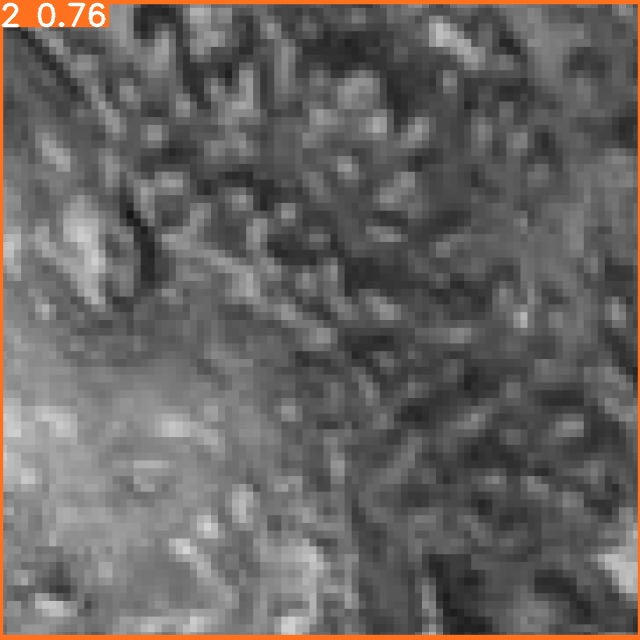

/n


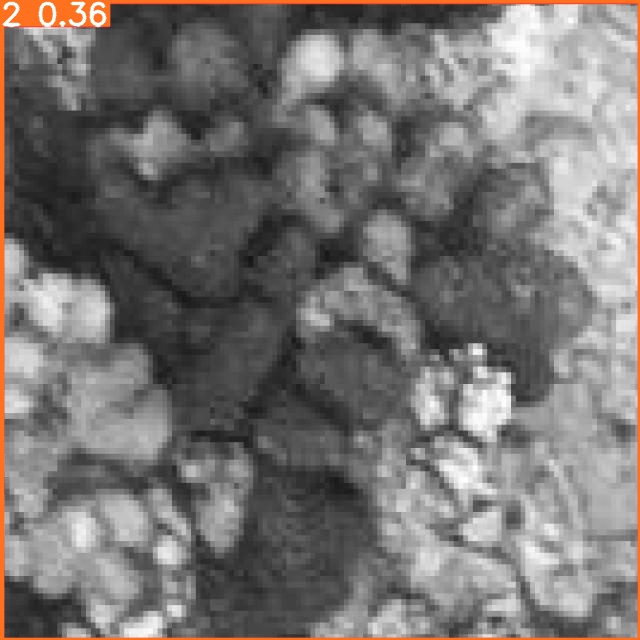

/n


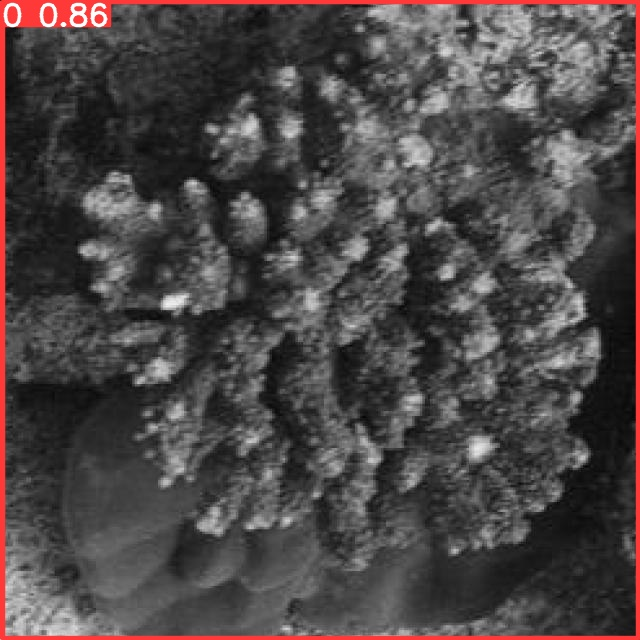

/n


In [12]:
import glob
from IPython.display import Image, display

i = 0
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
  i += 1

  if i<30:
    display(Image(filename=imageName))
    print('/n')
    

In [11]:
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>